## Imports

In [1]:
import traitlets
import ipywidgets.widgets as widgets
from IPython.display import display
#change for JetRacer ******************
from jetbot import Camera, bgr8_to_jpeg, Robot

import torch.nn.functional as F
import time
import matplotlib.pyplot as plt
import torch
import torchvision
import cv2
import numpy as np

%matplotlib inline

Matplotlib created a temporary config/cache directory at /home/jetbot/.cache/matplotlib because the default path (/tmp/matplotlib-1rxuzhfc) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.
Matplotlib is building the font cache; this may take a moment.


## Camera

In [2]:
#change for JetRacer ******************
camera = Camera.instance(width=300, height=224, fps = 4)

def get_snapshot(camera):
    #change for JetRacer ******************
    x = camera.value 
    
    x = cv2.cvtColor(x, cv2.COLOR_BGR2RGB)
    return x

In [3]:
get_snapshot(camera).shape

(224, 300, 3)

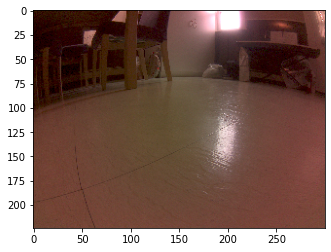

In [4]:
plt.imshow(get_snapshot(camera))
plt.show()

## Collision avoidance

In [5]:
collision_model = torchvision.models.alexnet(pretrained=False)
collision_model.classifier[6] = torch.nn.Linear(collision_model.classifier[6].in_features, 2)
collision_model.load_state_dict(torch.load('best_model_owen.pth'))
device = torch.device('cuda')
collision_model = collision_model.to(device)

In [6]:
mean = 255.0 * np.array([0.485, 0.456, 0.406])
stdev = 255.0 * np.array([0.229, 0.224, 0.225])

normalize = torchvision.transforms.Normalize(mean, stdev)

def prep_img_for_model(img):
    global device, normalize
    x = img.transpose((2, 0, 1))
    x = torch.from_numpy(x).float()
    x = normalize(x)
    x = x.to(device)
    x = x[None, ...]
    return x

## Object location

In [7]:
from models import *
from utils import *

import os, sys, time, datetime, random
import torch
from torch.utils.data import DataLoader
from torchvision import transforms#,datasets
from torch.autograd import Variable

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import cv2
import time

config_path='config/yolov3.cfg'
weights_path='config/yolov3.weights'
class_path='config/coco.names'

img_size=416
conf_thres=0.8
nms_thres=0.4

# Load model and weights
model = Darknet(config_path, img_size=img_size)
model.load_weights(weights_path)
model.cuda()
model.eval()
classes = utils.load_classes(class_path)
Tensor = torch.cuda.FloatTensor


def detect_image(img):
    # scale and pad image
    ratio = min(img_size/img.size[0], img_size/img.size[1])
    imw = round(img.size[0] * ratio)
    imh = round(img.size[1] * ratio)
#     print("transforming image")
    img_transforms = transforms.Compose([ transforms.Resize((imh, imw)),
         transforms.Pad((max(int((imh-imw)/2),0), max(int((imw-imh)/2),0), max(int((imh-imw)/2),0), max(int((imw-imh)/2),0)),
                        (128,128,128)),
         transforms.ToTensor(),
         ])
#     print("Transformation done")
    
    # convert image to Tensor
    image_tensor = img_transforms(img).float()
    image_tensor = image_tensor.unsqueeze_(0)
    input_img = Variable(image_tensor.type(Tensor))
    
    # run inference on the model and get detections
#     print("Starting inference")
    with torch.no_grad():
        detections = model(input_img)
        detections = utils.non_max_suppression(detections, 80, conf_thres, nms_thres)
#     print("inference finished")

    return detections[0]


# load image and get detections
def find_object(object_name,img,selection='object_only',visualize=False, style='line'):
    prev_time = time.time()
    object_found=False
    #Detecting objects
    detections = detect_image(img)

    inference_time = datetime.timedelta(seconds=time.time() - prev_time)
    
    object_dict={}
    
    if detections is not None:
        start_time = time.time()
        unique_labels = detections[:, -1].cpu().unique()
        n_cls_preds = len(unique_labels)

        #converting the image to numpy array
        img = np.array(img)
        
        pad_x = max(img.shape[0] - img.shape[1], 0) * (img_size / max(img.shape))
        pad_y = max(img.shape[1] - img.shape[0], 0) * (img_size / max(img.shape))
        unpad_h = img_size - pad_y
        unpad_w = img_size - pad_x
        
        if visualize==True:
            cmap = plt.get_cmap('tab20b')
            colors = [cmap(i) for i in np.linspace(0, 1, 20)]
            bbox_colors = random.sample(colors, n_cls_preds)
            plt.figure()
            fig, ax = plt.subplots(1, figsize=(12,9))
            ax.imshow(img)

        for x1, y1, x2, y2, conf, cls_conf, cls_pred in detections:
            if selection=='object_only' and classes[int(cls_pred)]!=object_name:
                continue
            else:
                object_found=True
            
            box_h = ((y2 - y1) / unpad_h) * img.shape[0]
            box_w = ((x2 - x1) / unpad_w) * img.shape[1]
            y1 = ((y1 - pad_y // 2) / unpad_h) * img.shape[0]
            x1 = ((x1 - pad_x // 2) / unpad_w) * img.shape[1]
            

            if visualize==True:
                color = bbox_colors[int(np.where(unique_labels == int(cls_pred))[0])]
                if style=='box':
                    bbox = patches.Rectangle((x1, y1), box_w, box_h, linewidth=2, edgecolor=color, facecolor='none')
                else:
                    bbox = patches.Rectangle((x1, y1+box_h), box_w, 0, linewidth=2, edgecolor=color, facecolor='none')
                ax.add_patch(bbox)
                plt.text(x1, y1, s=classes[int(cls_pred)], color='white', verticalalignment='top',bbox={'color': color, 'pad': 0})

#             object_dict[classes[int(cls_pred)]]=(classes[int(cls_pred)],((x1+box_h).item(),(y1).item()),((x1+box_h+box_w).item(),(y1).item()))
            
            object_dict[classes[int(cls_pred)]]=(classes[int(cls_pred)],((x1).item(),(y1+box_h).item()),((x1+box_w).item(),(y1+box_h).item()))
            if object_found:
                break
            
        if visualize==True:
            plt.axis('off')
            plt.show()
    return object_dict

/usr/local/lib/python3.6/dist-packages/torch/nn/_reduction.py:43: UserWarning: size_average and reduce args will be deprecated, please use reduction='mean' instead.
  warnings.warn(warning.format(ret))


(2304, 4608, 3)


<Figure size 432x288 with 0 Axes>

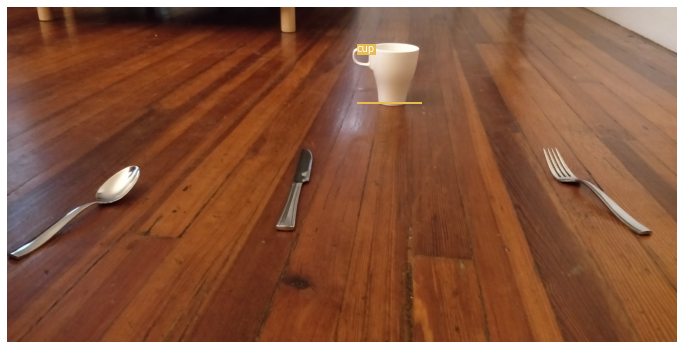

--- 40.11464071273804 seconds to get coordinates  ---
{'cup': ('cup', (2405.272705078125, 659.0421142578125), (2853.60595703125, 659.0421142578125))}


In [8]:
img_path = "images/utensils1.jpg"
obj = 'cup'
img = Image.open(img_path)
width, height = img.size  
print(np.array(img).shape)
start_time = time.time()
object_dict=find_object(obj,img,'all',True)
print("--- %s seconds to get coordinates  ---" % (time.time() - start_time))
print(object_dict)
x1, x2, y = object_dict[obj][1][0], object_dict[obj][2][0], object_dict[obj][1][1]
# print(x1, x2, y)

<Figure size 432x288 with 0 Axes>

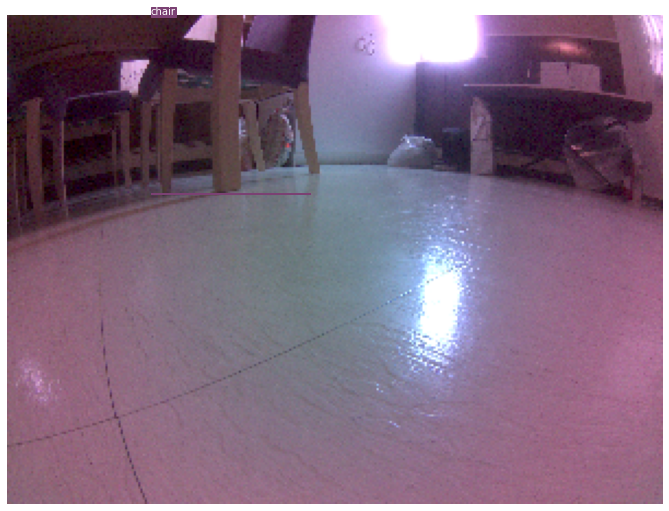

--- 3.6444098949432373 seconds to get coordinates  ---
{'chair': ('chair', (65.30043029785156, 81.455810546875), (138.5093231201172, 81.455810546875))}
<PIL.Image.Image image mode=RGB size=300x224 at 0x7EEC4CE4A8>


In [9]:
img = Image.fromarray(get_snapshot(camera))
width, height = img.size  
start_time = time.time()
object_dict=find_object('cup',img,'all',True)
print("--- %s seconds to get coordinates  ---" % (time.time() - start_time))
print(object_dict)
print(img)

## Control loop

In [10]:
#change for JetRacer ******************
def move_straight(robot): 
    print("move straight")
    robot.forward(0.4)
    time.sleep(.3)
    robot.stop()

In [11]:
#change for JetRacer ******************
def turn_left(bot, deg = 30):
    print("turn left")
    wait = deg/320
    bot.left(.4)
    time.sleep(wait)
    bot.stop()

In [12]:
#change for JetRacer ******************
def turn_right(bot, deg = 30):
    print("turn right")
    wait = deg/320
    bot.right(.4)
    time.sleep(wait)
    bot.stop()

In [13]:
#change for JetRacer ******************
robot = Robot()

In [14]:
def look_for(robot, camera, obj, show_all = False):
    for i in range(40):
        time.sleep(.2)
        img = get_snapshot(camera)
        center = img.shape[1]/2
        margin = .15 * img.shape[1]
        max_height = img.shape[0]*.5
        

        img_preped = prep_img_for_model(img)
        y = collision_model(img_preped)
        y = F.softmax(y, dim=1)
        prob_blocked = np.round(float(y.flatten()[0]),2)

        object_dict = find_object(obj,Image.fromarray(img),'object_only',show_all)
        
        found = bool(len(object_dict.keys()) > 0)
        
        if show_all and not found:
            plt.imshow(img)
            plt.show()
            print("Prob blocked:", prob_blocked)
            print("object dict:", object_dict)
        
        if found:
            x1, x2, y = object_dict[obj][1][0], object_dict[obj][2][0], object_dict[obj][1][1]
            ave = (x1+x2)/2
            print("Found:", obj, x1, x2, y)
            if y >= max_height or ((x2-x1)>img.shape[1]/3):
                print("Done!")
                break
            else:
                if np.abs(ave-center)>.1*img.shape[1]:
                    if center<ave:
                        turn_right(robot, (ave-center)/img.shape[1]*120)
                    elif center>ave:
                        turn_left(robot, (center-ave)/img.shape[1]*120)

                if prob_blocked < .5:
                    move_straight(robot)
                else:
                    turn_left(robot)
            
        else:
            print("could not find:", obj)
            turn_left(robot)

        time.sleep(.2)
        print("______________________")
        print()


<Figure size 432x288 with 0 Axes>

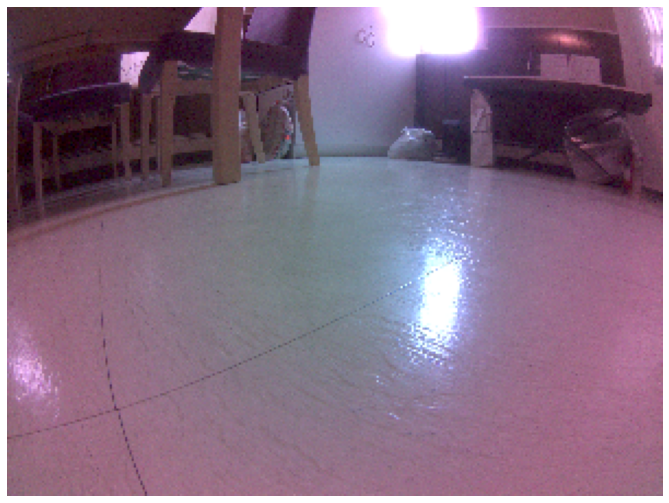

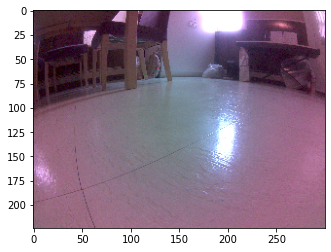

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

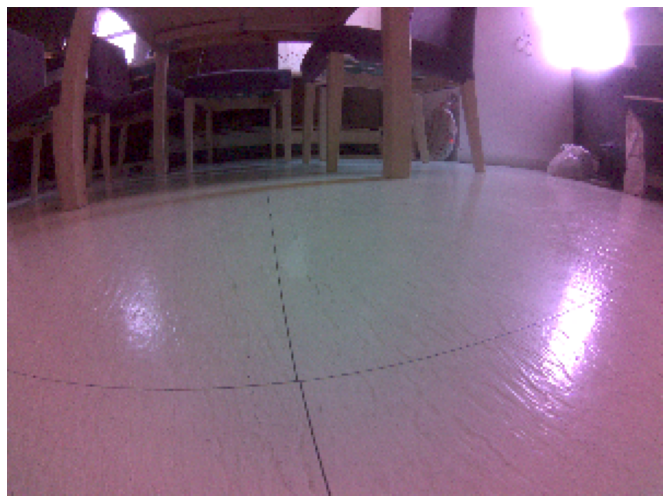

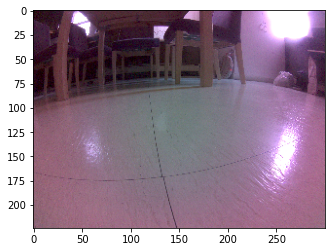

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

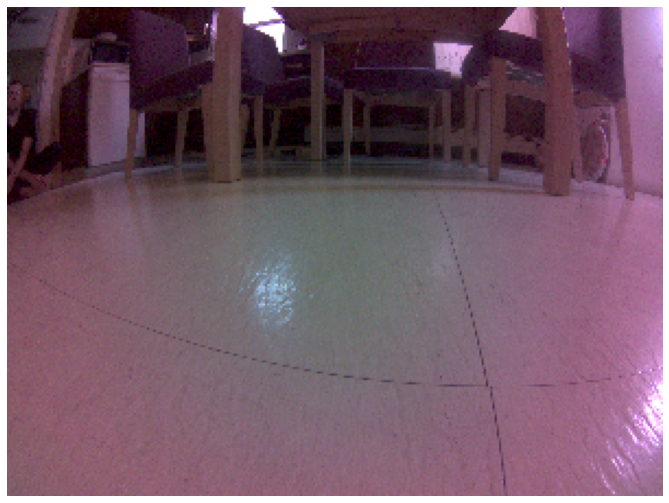

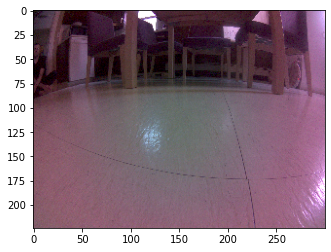

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

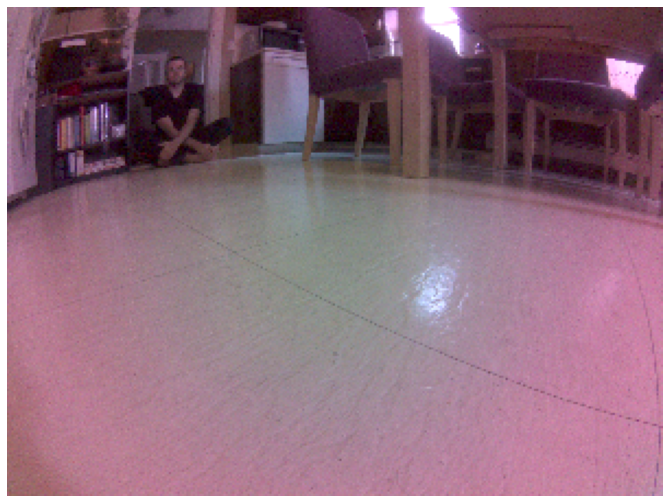

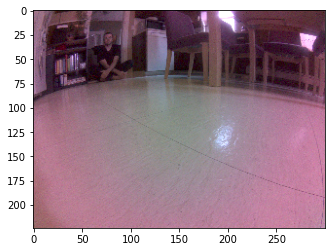

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

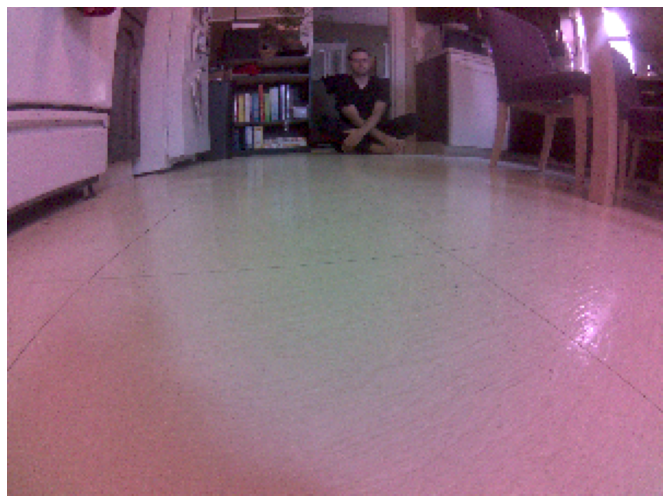

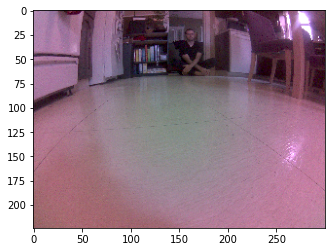

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



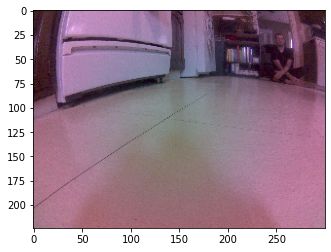

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



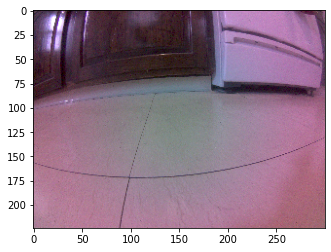

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



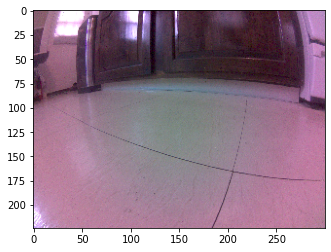

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



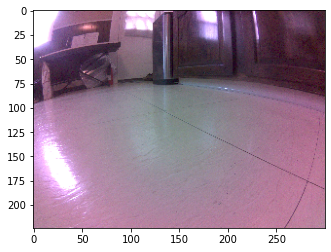

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

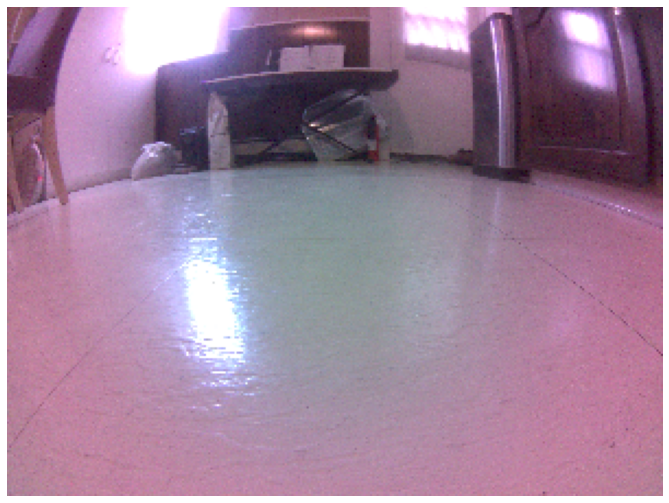

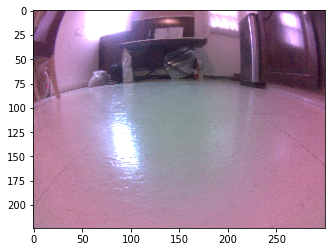

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

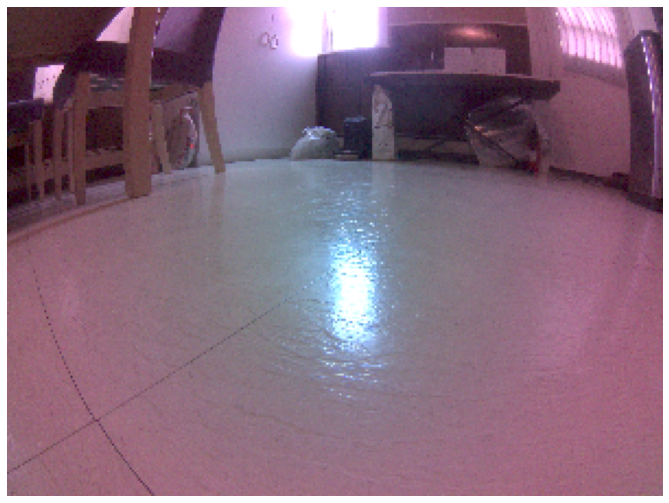

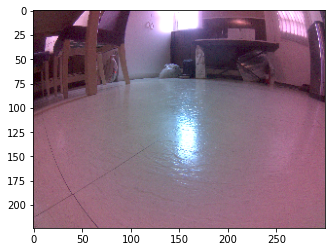

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

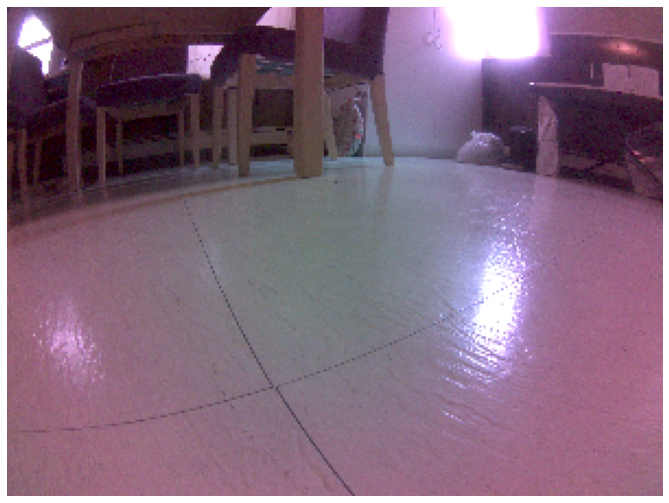

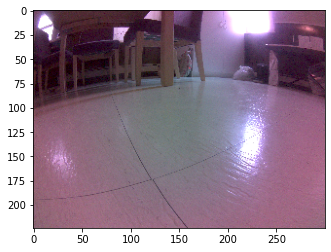

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

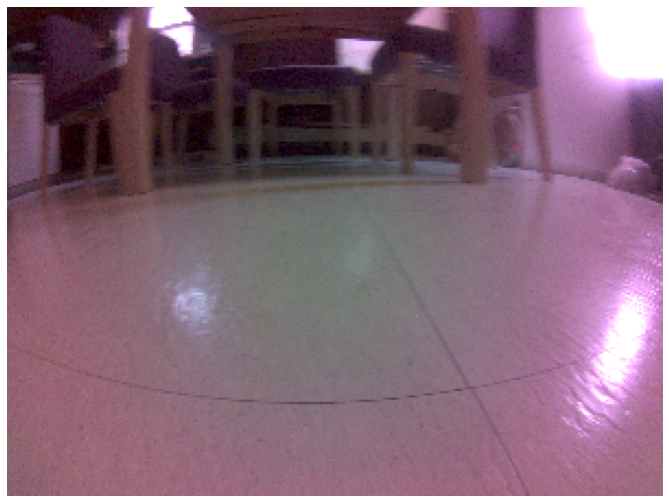

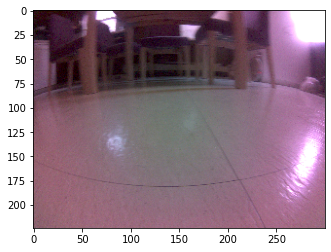

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

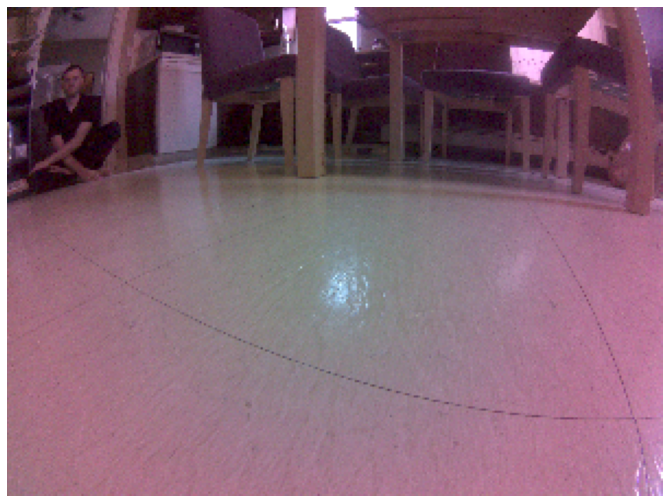

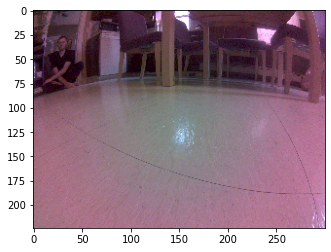

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

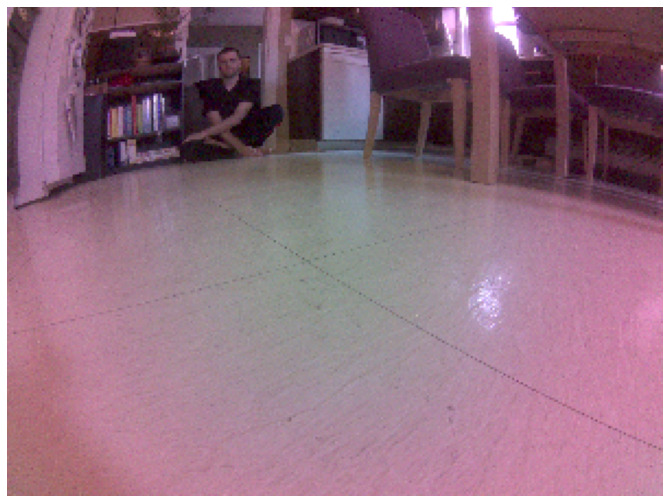

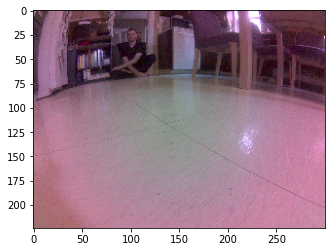

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

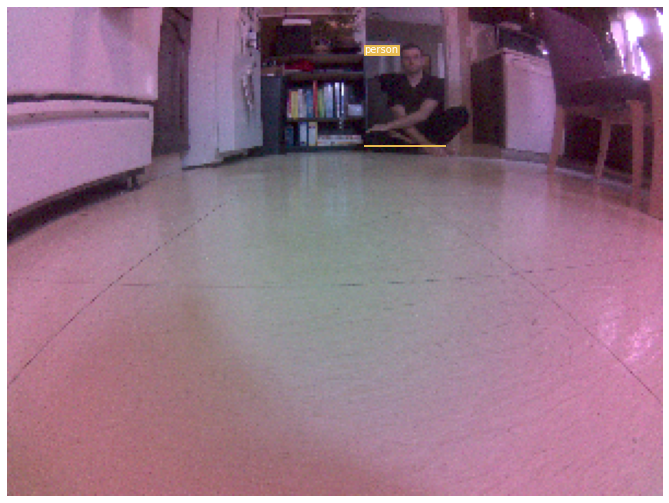

Found: person 163.04087829589844 200.42738342285156 63.2791748046875
turn right
move straight
______________________



<Figure size 432x288 with 0 Axes>

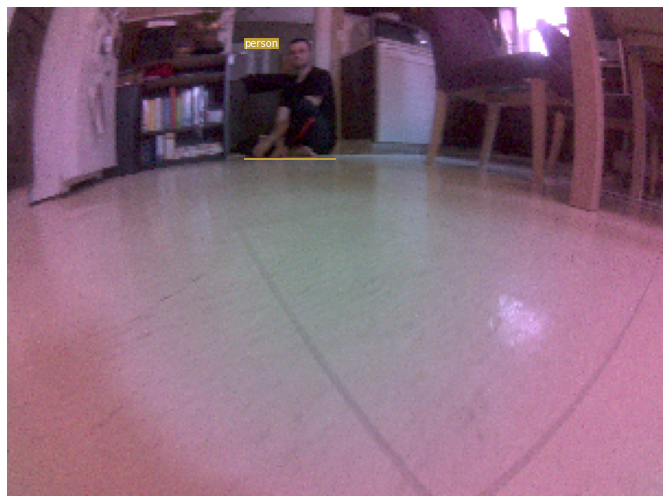

Found: person 107.8170394897461 150.22103881835938 69.22184753417969
move straight
______________________



<Figure size 432x288 with 0 Axes>

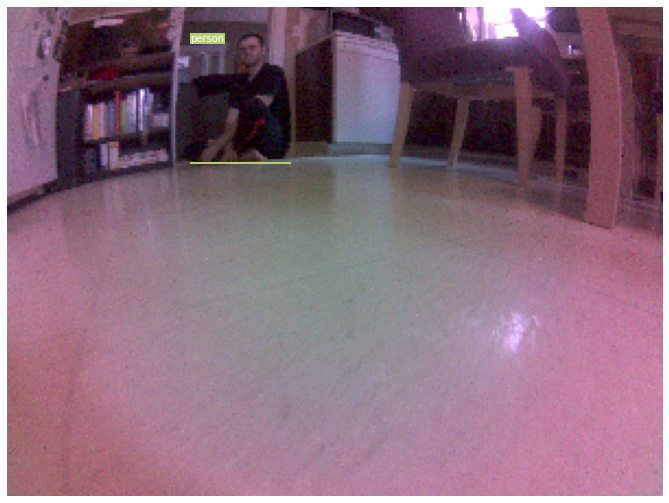

Found: person 83.35186767578125 129.54739379882812 71.26554870605469
turn left
move straight
______________________



<Figure size 432x288 with 0 Axes>

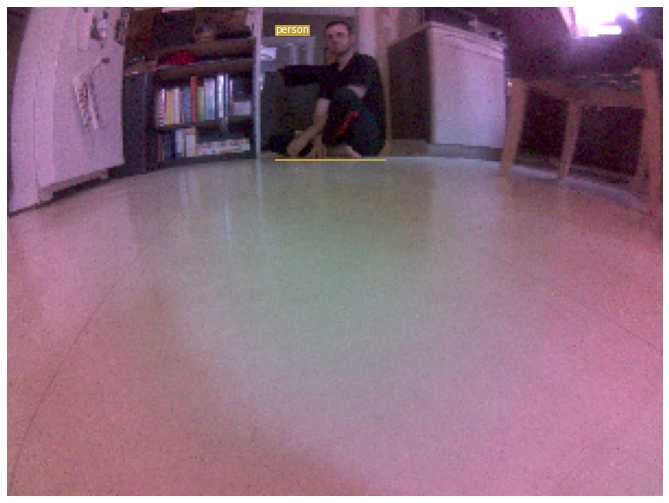

Found: person 122.27313995361328 172.83261108398438 69.62845611572266
move straight
______________________



<Figure size 432x288 with 0 Axes>

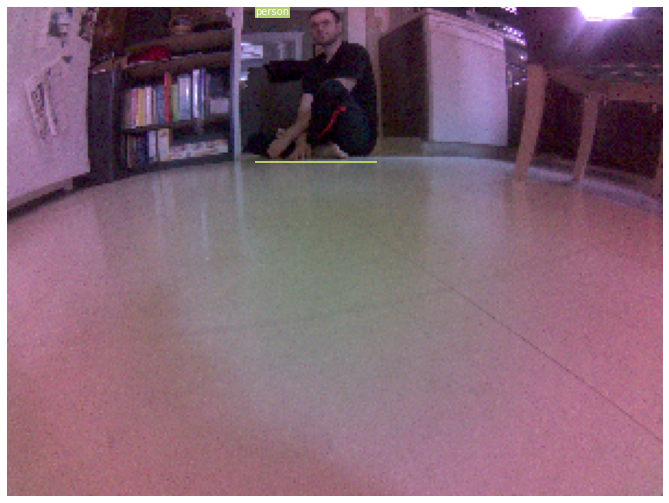

Found: person 113.12673950195312 168.99913024902344 70.74222564697266
move straight
______________________



<Figure size 432x288 with 0 Axes>

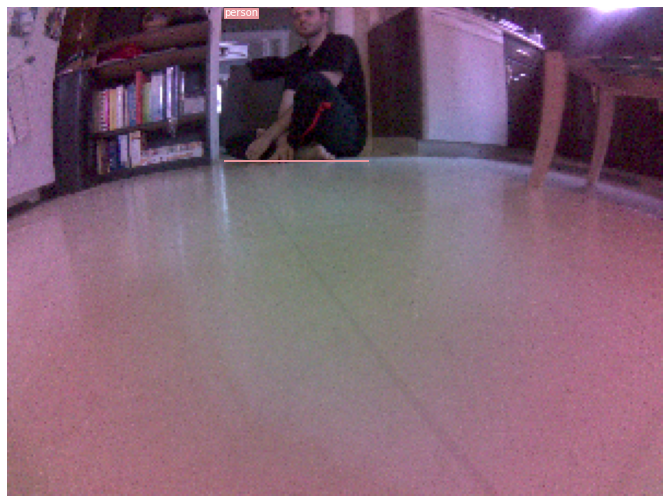

Found: person 98.89844512939453 165.321533203125 70.1391372680664
move straight
______________________



<Figure size 432x288 with 0 Axes>

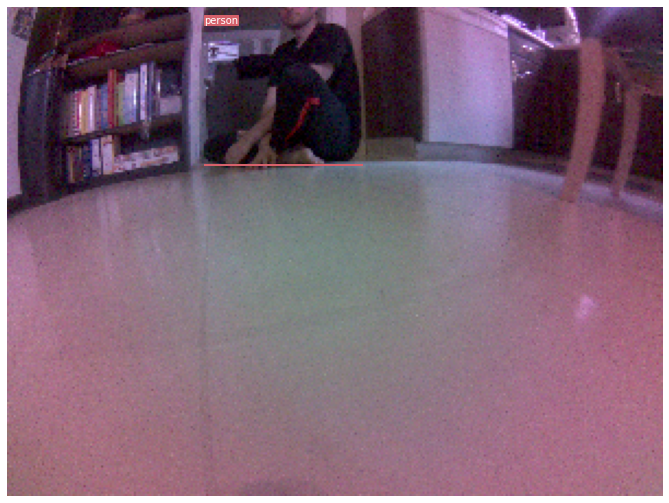

Found: person 89.60486602783203 162.23033142089844 71.94681549072266
move straight
______________________



<Figure size 432x288 with 0 Axes>

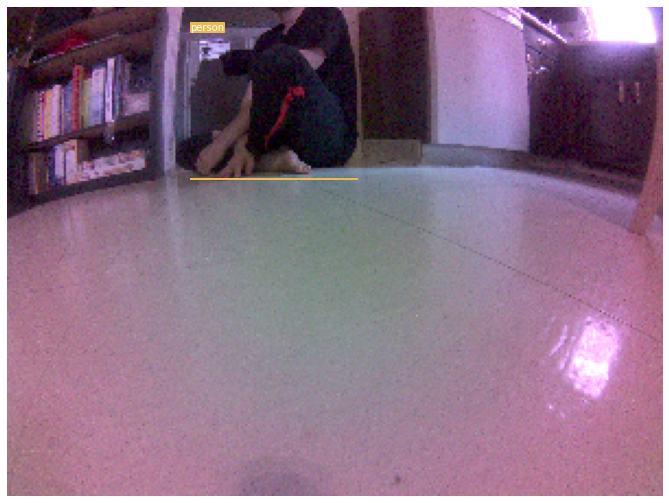

Found: person 83.31956481933594 160.0424346923828 78.42134094238281
move straight
______________________



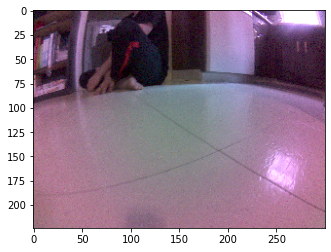

Prob blocked: 0.0
object dict: {}
could not find: person
turn left
______________________



<Figure size 432x288 with 0 Axes>

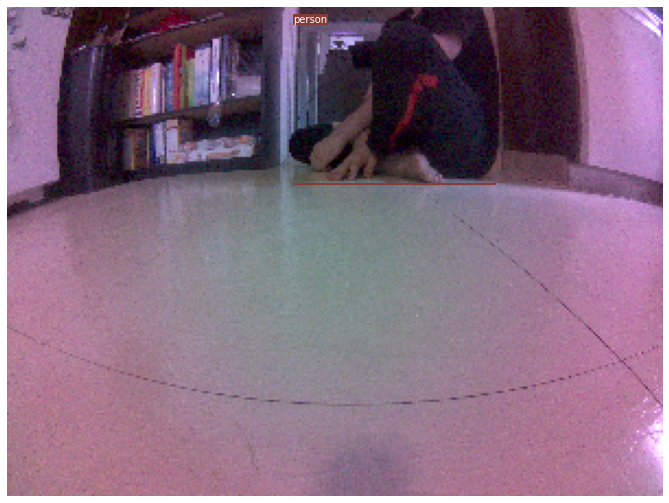

Found: person 130.28457641601562 223.3636474609375 80.66499328613281
move straight
______________________



<Figure size 432x288 with 0 Axes>

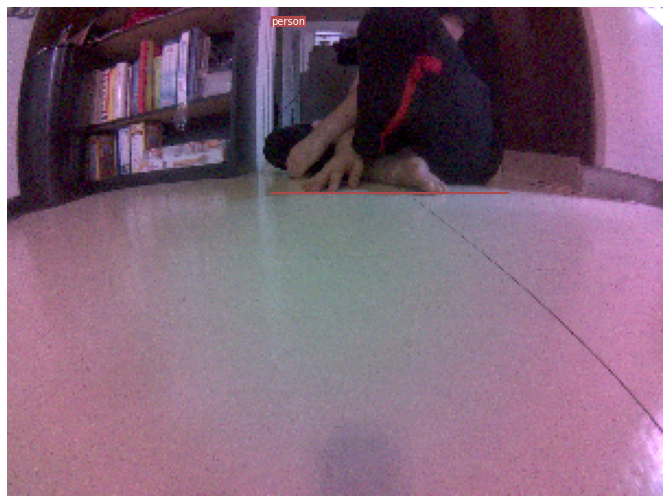

Found: person 120.30584716796875 229.45098876953125 84.69758605957031
Done!


In [15]:
look_for(robot, camera, 'person',True)

In [ ]:
robot.stop()